In [1]:

from collections import Counter
import matplotlib.pyplot as plt
from matplotlib import cm
from math import log
import numpy as np
import pandas as pd 
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score
from sklearn.manifold import MDS
exec(compile(open(r"../nsimplices.py", encoding="utf8").read(), "nsimplices.py", 'exec'))

In [2]:
dataset_id = 'Zhengmix8eq'
df_gene = pd.read_csv(f"~/nSimplices/data/sce_full_{dataset_id}_scScope_log.csv", index_col=0, header=0)

print(df_gene.shape)
df_gene

(3994, 11648)


,ENSG00000237683,ENSG00000228327,ENSG00000225880,ENSG00000188976,ENSG00000188290,ENSG00000187608,ENSG00000131591,ENSG00000186891,ENSG00000186827,ENSG00000078808,...,ENSG00000198938,ENSG00000198840,ENSG00000212907,ENSG00000198886,ENSG00000198786,ENSG00000198695,ENSG00000198727,ENSG00000220023,ENSG00000215700,ENSG00000215699
b.cells1147,0.0,2.317388,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,3.626912,0.000000,0.0,0.000000,2.317388,0.0,2.960015,0.0,0.000000,0.0
b.cells6276,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,3.192007,0.000000,0.0,4.083335,0.000000,0.0,2.539127,0.0,0.000000,0.0
b.cells6144,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,3.479594,1.986409,0.0,2.608496,2.608496,0.0,2.989107,0.0,0.000000,0.0
b.cells6285,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,4.695021,3.335779,0.0,4.010973,2.677600,0.0,4.811788,0.0,0.000000,0.0
b.cells8679,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,3.901904,2.370180,0.0,3.404457,0.000000,0.0,3.404457,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
naive.t71,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,3.214279,2.828707,0.0,3.491864,2.192969,0.0,2.828707,0.0,0.000000,0.0
naive.t844,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,3.708124,0.000000,0.0,2.192262,0.000000,0.0,3.213515,0.0,0.000000,0.0
naive.t5831,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,3.860974,0.000000,0.0,2.803595,2.803595,0.0,2.803595,0.0,0.000000,0.0
naive.t1167,0.0,0.000000,0.0,0.0,0.0,2.598072,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.0,0.000000,0.000000,0.0,3.253301,0.0,0.000000,0.0


In [3]:
# preprocess the dataset 
df_array = np.array(df_gene)
gene_meds = np.median(df_array, axis=0)
genes = df_gene.columns.values
gene_meds.shape

(11648,)

In [4]:
zipped = zip(gene_meds, genes)
    
# Sort the zipped array based on the values in the first array
sorted_zipped = sorted(zipped, key=lambda x: x[0], reverse=True)

# Unzip the sorted array
sorted_gene_meds, sorted_genes = zip(*sorted_zipped)

med_counts_dict = {}
for gene, med in zip(sorted_genes, sorted_gene_meds):
    med_counts_dict[gene] = med

In [5]:
# only consider the top 500 expressed genes
top_genes = sorted_genes[:500]
# print(top_genes)
df_gene = df_gene.loc[:, top_genes] 

# filter out cells with more than 100 zero counts
delete_indices = []
for index, row in df_gene.iterrows():
    if list(row).count(0) > 100:
        delete_indices.append(index)

# df_gene = df_gene.drop(delete_indices)
print(df_gene.shape)


(3994, 500)


In [6]:

### Run nSimplices method
feature_num = df_gene.shape[1]
dim_start = 2
dim_end = 10
out_dis = pdist(df_gene)
out_dis_sq = squareform(out_dis)
num_point = df_gene.shape[0]

outlier_indices, subspace_dim, corr_dis_sq, corr_coord = nsimplices(out_dis_sq, feature_num, dim_start, dim_end, euc_coord=np.array(df_gene.copy()), std_multi=3)

dim in find_subspace_dim is: 2
dim in find_subspace_dim is: 3
dim in find_subspace_dim is: 4
dim in find_subspace_dim is: 5
dim in find_subspace_dim is: 6
dim in find_subspace_dim is: 7
dim in find_subspace_dim is: 8
dim in find_subspace_dim is: 9
dim in find_subspace_dim is: 10
med_height is: [17.60133558 16.96569451 16.53633996 16.20148905 15.97477319 15.77109531
 15.60974572 15.46854204 15.35422579]
subspace_dim is: 3
thres is: 21.95060182043226 mean is: 17.568435011661123 std is: 1.460722269590379
outlier indices are: [  34   79  149  169  205  212  295  345  358  511  897  898  900  901
  904  905  906  907  909  911  912  915  918  920  921  922  924  925
  926  927  928  929  930  931  933  937  938  940  941  945  946  948
  951  956  957  959  961  962  965  966  967  970  973  974  975  977
  978  979  980  983  984  985  986  988  989  990  991  992  995  997
  999 1003 1004 1006 1007 1008 1009 1013 1015 1016 1019 1020 1021 1022
 1023 1024 1025 1027 1028 1030 1034 1035 1036 

In [7]:
print(outlier_indices)
len(outlier_indices)

[  34   79  149  169  205  212  295  345  358  511  897  898  900  901
  904  905  906  907  909  911  912  915  918  920  921  922  924  925
  926  927  928  929  930  931  933  937  938  940  941  945  946  948
  951  956  957  959  961  962  965  966  967  970  973  974  975  977
  978  979  980  983  984  985  986  988  989  990  991  992  995  997
  999 1003 1004 1006 1007 1008 1009 1013 1015 1016 1019 1020 1021 1022
 1023 1024 1025 1027 1028 1030 1034 1035 1036 1037 1040 1042 1044 1045
 1046 1047 1049 1050 1055 1056 1059 1060 1061 1063 1065 1067 1068 1070
 1072 1076 1080 1081 1083 1085 1086 1088 1090 1093 1096 1097 1098 1099
 1101 1103 1105 1108 1109 1112 1113 1114 1115 1118 1121 1123 1124 1127
 1128 1137 1139 1142 1145 1146 1147 1153 1155 1156 1157 1159 1160 1161
 1162 1163 1165 1166 1167 1168 1169 1170 1171 1173 1174 1176 1177 1178
 1184 1187 1188 1189 1190 1191 1192 1193 1194 1195 1196 1199 1201 1203
 1204 1205 1207 1208 1209 1214 1215 1216 1217 1219 1221 1223 1226 1229
 1231 

389

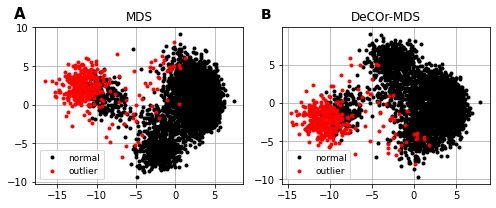

In [8]:
normal_indices=[i for i in range(num_point) if i not in outlier_indices] # list of normal points 

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7,3))



# plot original graphs with outliers added 
va, ve, Xe = cMDS(out_dis_sq)
ax1.plot(Xe[normal_indices,0],Xe[normal_indices,1],'.', color='black', label="normal")
ax1.plot(Xe[outlier_indices,0],Xe[outlier_indices,1],'.',color='red', label="outlier")
ax1.legend(fontsize=9)
ax1.grid()
ax1.set_title("MDS")
ax1.text(-0.1, 1.05, 'A', transform=ax1.transAxes, 
        size=15, weight='bold')

# plot correct outliers 
va, ve, Xe = cMDS(corr_dis_sq)   
ax2.plot(Xe[normal_indices,0],-Xe[normal_indices,1],'.', color='black', label="normal")
ax2.plot(Xe[outlier_indices,0],-Xe[outlier_indices,1],'.',color='red', label="outlier")
ax2.legend(fontsize=9)
ax2.set_title("DeCOr-MDS")
ax2.text(-0.1, 1.05, 'B', transform=ax2.transAxes, 
        size=14, weight='bold')
ax2.grid()
plt.tight_layout()
fig_path =  f"../outputs/{dataset_id}_MDS_xy.pdf"
plt.savefig(fig_path)
plt.show()
plt.close()

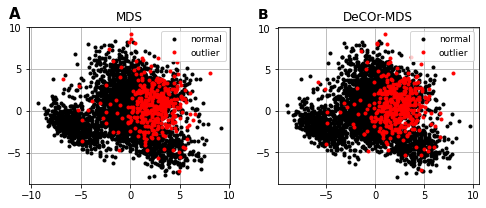

In [9]:
normal_indices=[i for i in range(num_point) if i not in outlier_indices] # list of normal points 

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7,3))



# plot original graphs with outliers added 
va, ve, Xe = cMDS(out_dis_sq)
ax1.plot(Xe[normal_indices,1],Xe[normal_indices,2],'.', color='black', label="normal")
ax1.plot(Xe[outlier_indices,1],Xe[outlier_indices,2],'.',color='red', label="outlier")
ax1.legend(fontsize=9)
ax1.grid()
ax1.set_title("MDS")
ax1.text(-0.1, 1.05, 'A', transform=ax1.transAxes, 
        size=15, weight='bold')

# plot correct outliers 
va, ve, Xe = cMDS(corr_dis_sq)   
ax2.plot(Xe[normal_indices,1],Xe[normal_indices,2],'.', color='black', label="normal")
ax2.plot(Xe[outlier_indices,1],Xe[outlier_indices,2],'.',color='red', label="outlier")
ax2.legend(fontsize=9)
ax2.set_title("DeCOr-MDS")
ax2.text(-0.1, 1.05, 'B', transform=ax2.transAxes, 
        size=14, weight='bold')
ax2.grid()
plt.tight_layout()
fig_path =  f"../outputs/{dataset_id}_MDS_yz.pdf"
plt.savefig(fig_path)
plt.show()
plt.close()

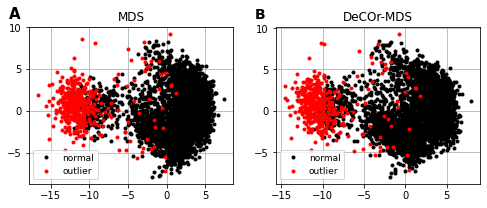

In [10]:
normal_indices=[i for i in range(num_point) if i not in outlier_indices] # list of normal points 

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7,3))



# plot original graphs with outliers added 
va, ve, Xe = cMDS(out_dis_sq)
ax1.plot(Xe[normal_indices,0],Xe[normal_indices,2],'.', color='black', label="normal")
ax1.plot(Xe[outlier_indices,0],Xe[outlier_indices,2],'.',color='red', label="outlier")
ax1.legend(fontsize=9)
ax1.grid()
ax1.set_title("MDS")
ax1.text(-0.1, 1.05, 'A', transform=ax1.transAxes, 
        size=15, weight='bold')

# plot correct outliers 
va, ve, Xe = cMDS(corr_dis_sq)   
ax2.plot(Xe[normal_indices,0],Xe[normal_indices,2],'.', color='black', label="normal")
ax2.plot(Xe[outlier_indices,0],Xe[outlier_indices,2],'.',color='red', label="outlier")
ax2.legend(fontsize=9)
ax2.set_title("DeCOr-MDS")
ax2.text(-0.1, 1.05, 'B', transform=ax2.transAxes, 
        size=14, weight='bold')
ax2.grid()
plt.tight_layout()
# fig_path =  "../outputs/Darmanis_MDS_xz.pdf"
# plt.savefig(fig_path)
plt.show()
plt.close()

In [11]:
# 3D plot

from plotly.subplots import make_subplots
import plotly.graph_objects as go

outlier_inds = np.zeros(df_gene.shape[0])
outlier_inds[outlier_indices] = 1

fig = make_subplots(rows=1, cols=2, 
                    specs=[[{'type': 'scene'}, {'type': 'scene'}]],
                    subplot_titles=('MDS',  'DeCOr-MDS'))

va, ve, Xe = cMDS(out_dis_sq)

# fig.add_trace(
#     go.Scatter3d(x=Xe[normal_indices, 0], y=[normal_indices, 1], z=Xe[normal_indices, 2], mode='markers', \
#                  marker=dict(size=3, color='yellow')),
#         row=1, col=1)



fig.add_trace(
    go.Scatter3d(x=Xe[normal_indices, 0], y=Xe[normal_indices, 1], z=Xe[normal_indices, 2], mode='markers', name = "normal", marker=dict(size=3, color='blue')),
    row=1, col=1
)

fig.add_trace(
    go.Scatter3d(x=Xe[outlier_indices, 0], y=Xe[outlier_indices, 1], z=Xe[outlier_indices, 2], mode='markers', name = "outlier", marker=dict(size=3, color='red')),
    row=1, col=1
)

va, ve, Xe = cMDS(corr_dis_sq)   
fig.add_trace(
    go.Scatter3d(x=Xe[normal_indices, 0], y=Xe[normal_indices, 1], z=-Xe[normal_indices, 2], mode='markers', name = "normal", marker=dict(size=3, color='blue')),
    row=1, col=2
)

fig.add_trace(
    go.Scatter3d(x=Xe[outlier_indices, 0], y=Xe[outlier_indices, 1], z=-Xe[outlier_indices, 2], mode='markers', name = "outlier", marker=dict(size=3, color='red')),
    row=1, col=2
)

# fig.update_layout(height=600, width=800, title_text="Side By Side Subplots")
fig.show()
fig_path = f"../outputs/{dataset_id}_MDS_3D.html"
fig.write_html(fig_path)

In [12]:
# examine the gene expression count profile

def count_outlier_percent(all_counts, outlier_counts):
    def find_outlier_bound(all_counts):
        # Calculate the first and third quartiles (Q1 and Q3)
        q1 = np.percentile(all_counts, 25)
        q3 = np.percentile(all_counts, 75)

        # Calculate the interquartile range (IQR)
        iqr = q3 - q1

        # Define the lower and upper bounds for outliers
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        return lower_bound, upper_bound
    
    lower_bound, upper_bound = find_outlier_bound(all_counts)

    return sum((count > upper_bound or count < lower_bound) for count in outlier_counts)/len(outlier_counts)

In [13]:
print(len(top_genes))

500


In [14]:
box_plot_dict = {}
top_greater_genes = []
for gene in top_genes:
    outlier_counts = list(df_gene.iloc[outlier_indices][gene])
    all_counts = list(df_gene[gene])
    if count_outlier_percent(all_counts, outlier_counts) > 0.5:
        counts =  list(df_gene[gene])
        box_plot_dict[gene] = counts
        top_greater_genes.append(gene)

print(len(top_greater_genes))

7


In [15]:
outlier_x = []
outlier_y = []
for index in outlier_indices:
    for gene in top_greater_genes:
        gene_index = top_greater_genes.index(gene)+1
        outlier_x.append(gene_index)
        outlier_gene_count = df_gene.iloc[index][gene]
        outlier_y.append(outlier_gene_count)


In [16]:
print(outlier_x)
print(outlier_y)
print(box_plot_dict)

[1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 5, 6, 7, 1, 2, 3, 4, 

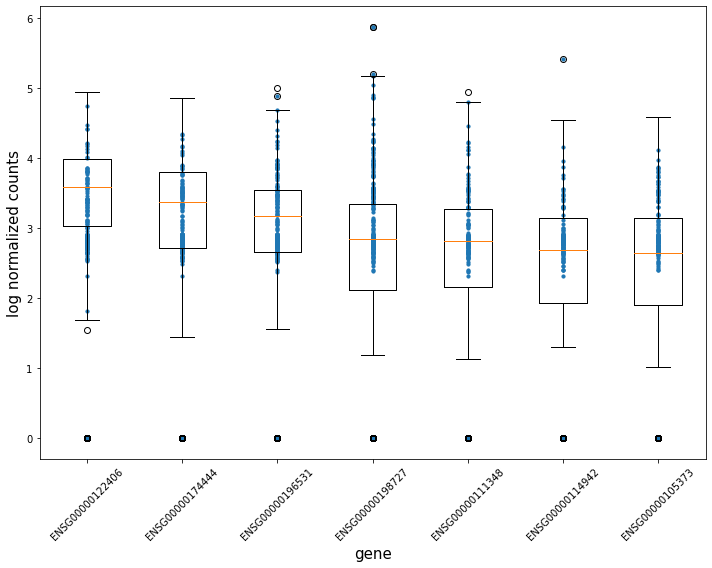

In [17]:
fig, ax = plt.subplots()
fig.set_figheight(8)
fig.set_figwidth(10)
label_size = 15
ax.boxplot(box_plot_dict.values())
ax.set_xticklabels(box_plot_dict.keys())
plt.scatter(x=outlier_x, y=outlier_y, s=10)
ax.tick_params(axis='x', rotation=45)
plt.xlabel("gene", fontsize=label_size)
plt.xticks(fontsize=10)
plt.ylabel("log normalized counts", fontsize=label_size)
plt.yticks(fontsize=10)
plt.tight_layout()
figpath = f"../outputs/{dataset_id}_gene_profile.pdf"
plt.savefig(figpath)
plt.show()

